<h1>CS 445 Final Project: Cycle-GAN Implementation and Experimentation</h1>

Code heavily based on implementation at https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/GANs/CycleGAN
<br>
Video tutorial at https://www.youtube.com/watch?v=4LktBHGCNfw&t=3s
<br>
Monet dataset found at https://www.kaggle.com/c/gan-getting-started/data
<br>
Horse to Zebra dataset found at https://www.kaggle.com/datasets/suyashdamle/cyclegan
<br>
Original paper found at https://arxiv.org/pdf/1703.10593.pdf
<br>
Methods made by me have a comment that says "original" above them

In [1]:
import torch
import torch.nn as nn
import os
from PIL import Image
import matplotlib.pyplot as plt
import random
import numpy as np
import albumentations as A
from torch.utils.data import Dataset
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
import torch.optim as optim
from tqdm import tqdm
from torchvision.utils import save_image
import torchvision.transforms as transformer

A few helper methods

Utils

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TRAIN_DIR = "./data/horse2zebra/horse2zebra"
VAL_DIR = "data/val"
BATCH_SIZE = 1
LEARNING_RATE = 1e-5
LAMBDA_IDENTITY = 0.0
LAMBDA_CYCLE = 10
NUM_WORKERS = 0
NUM_EPOCHS = 100
LOAD_MODEL = False
SAVE_MODEL = True
CHECKPOINT_GEN_H = "genh.pth.tar"
CHECKPOINT_GEN_Z = "genz.pth.tar"
CHECKPOINT_CRITIC_H = "critich.pth.tar"
CHECKPOINT_CRITIC_Z = "criticz.pth.tar"

image_transforms = A.Compose(
    [
        A.Resize(width=256, height=256),
        A.HorizontalFlip(p=0.5),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image"},
)

def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    # Unnecessary to print loading checkpoint every time
    #print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr


def seed_everything(seed=42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

Block

In [3]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )
    
    def forward(self, x):
        return self.conv(x)

Discriminator

In [4]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels, features[0], kernel_size=4, stride=2, padding=1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(Block(in_channels, feature, stride=1 if feature==features[-1] else 2))
            in_channels = feature
        layers.append(nn.Conv2d(in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))

Conv and Residual Blocks

In [5]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)
    
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

Generator

In [6]:
class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.ReLU(inplace=True),
        )

        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
            ]
        )

        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )

        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ]
        )

        self.last = nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.residual_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))

Dataset

In [7]:
class HorseZebraDataset(Dataset):
    def __init__(self, root_zebra, root_horse, transform=None):
        super().__init__()
        self.root_zebra = root_zebra
        self.root_horse = root_horse
        self.transform = transform

        self.zebra_images = os.listdir(root_zebra)
        self.horse_images = os.listdir(root_horse)
        self.length_dataset = max(len(self.zebra_images), len(self.horse_images))
        self.zebra_len = len(self.zebra_images)
        self.horse_len = len(self.horse_images)

    def __len__(self):
        return self.length_dataset
    
    def __getitem__(self, index):
        zebra_img = self.zebra_images[index % self.zebra_len]
        horse_img = self.horse_images[index % self.horse_len]

        zebra_path = os.path.join(self.root_zebra, zebra_img)
        horse_path = os.path.join(self.root_horse, horse_img)

        zebra_img = np.array(Image.open(zebra_path).convert("RGB"))
        horse_img = np.array(Image.open(horse_path).convert("RGB"))

        if self.transform:
            augmentations = self.transform(image=zebra_img, image0=horse_img)
            zebra_img = augmentations["image"]
            horse_img = augmentations["image0"]

        return zebra_img, horse_img

Train

In [8]:
def train_fn(disc_H, disc_Z, gen_Z, gen_H, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler):
    loop = tqdm(loader, leave=True)

    for idx, (zebra, horse) in enumerate(loop):
        zebra = zebra.to(DEVICE)
        horse = horse.to(DEVICE)

        with torch.cuda.amp.autocast():
            fake_horse = gen_H(zebra)
            D_H_real = disc_H(horse)
            D_H_fake = disc_H(fake_horse.detach())
            D_H_real_loss = mse(D_H_real, torch.ones_like(D_H_real))
            D_H_fake_loss = mse(D_H_fake, torch.zeros_like(D_H_fake))
            D_H_loss = D_H_real_loss + D_H_fake_loss

            fake_zebra = gen_Z(horse)
            D_Z_real = disc_Z(zebra)
            D_Z_fake = disc_Z(fake_zebra.detach())
            D_Z_real_loss = mse(D_Z_real, torch.ones_like(D_Z_real))
            D_Z_fake_loss = mse(D_Z_fake, torch.zeros_like(D_Z_fake))
            D_Z_loss = D_Z_real_loss + D_Z_fake_loss

            D_loss = (D_H_loss + D_Z_loss)/2

        opt_disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            #adversarial loss for both generators
            D_H_fake = disc_H(fake_horse)
            D_Z_fake = disc_Z(fake_zebra)
            loss_G_H = mse(D_H_fake, torch.ones_like(D_H_fake))
            loss_G_Z = mse(D_Z_fake, torch.ones_like(D_Z_fake))

            #cycle loss
            cycle_zebra = gen_Z(fake_horse)
            cycle_horse = gen_H(fake_zebra)
            cycle_zebra_loss = l1(zebra, cycle_zebra)
            cycle_horse_loss = l1(horse, cycle_horse)

            #identity loss
            identity_zebra = gen_Z(zebra)
            identity_horse = gen_H(horse)
            identity_zebra_loss = l1(zebra, identity_zebra)
            identity_horse_loss = l1(horse, identity_horse)

            #add together
            G_loss = (
                loss_G_Z
                + loss_G_H
                + cycle_zebra_loss * LAMBDA_CYCLE
                + cycle_horse_loss * LAMBDA_CYCLE
                + identity_horse_loss * LAMBDA_IDENTITY
                + identity_zebra_loss * LAMBDA_IDENTITY
            )

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 250 == 0:
            save_image(fake_horse*0.5+0.5, f"saved_images/horse_{idx}.png")
            save_image(fake_zebra*0.5+0.5, f"saved_images/zebra_{idx}.png")



Main is a function that trains a model. It will create all of the necessary parts for training a CylceGAN model, trains them, and then saves their states to a tar file in case you want to load the model later. It works this way so you don't have to retrain in the notebook as training for these models can take a significant amount of time.

In [9]:
def main():
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN_H,
            gen_H,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_GEN_Z,
            gen_Z,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_H,
            disc_H,
            opt_disc,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_Z,
            disc_Z,
            opt_disc,
            LEARNING_RATE,
        )

    dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/horse_train",
        root_zebra=TRAIN_DIR + "/zebra_train",
        transform=image_transforms,
    )
    test_dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/horse_test",
        root_zebra=TRAIN_DIR + "/zebra_test",
        transform=image_transforms,
    )
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        pin_memory=True,
    )
    loader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc_H,
            disc_Z,
            gen_Z,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )

        if SAVE_MODEL:
            save_checkpoint(gen_H, opt_gen, filename=CHECKPOINT_GEN_H)
            save_checkpoint(gen_Z, opt_gen, filename=CHECKPOINT_GEN_Z)
            save_checkpoint(disc_H, opt_disc, filename=CHECKPOINT_CRITIC_H)
            save_checkpoint(disc_Z, opt_disc, filename=CHECKPOINT_CRITIC_Z)


Test runs a test dataset if one exists. Easier to have this so you don't accidentally save a bad model if you forget to change the variable.

In [10]:
# original
def test():    
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()
    
    load_checkpoint(
        CHECKPOINT_GEN_H,
        gen_H,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_GEN_Z,
        gen_Z,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_H,
        disc_H,
        opt_disc,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_Z,
        disc_Z,
        opt_disc,
        LEARNING_RATE,
    )
    test_dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/horse_test",
        root_zebra=TRAIN_DIR + "/zebra_test",
        transform=image_transforms,
    )
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        pin_memory=True,
    )
    loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )

    for epoch in range(1):
        train_fn(
            disc_H,
            disc_Z,
            gen_Z,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )

Another method for testing individual images and what gets generated. Useful if you want to compare the original to what gets generated.

In [11]:
# original
def test_output(img_filepath, is_horse):
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )
    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )
    load_checkpoint(
        CHECKPOINT_GEN_H,
        gen_H,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_GEN_Z,
        gen_Z,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_H,
        disc_H,
        opt_disc,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_Z,
        disc_Z,
        opt_disc,
        LEARNING_RATE,
    )
    

    x = np.array(Image.open(img_filepath).convert("RGB"))
    original = Image.fromarray(x)
    augmentations = image_transforms(image=x)
    x = augmentations["image"].to(DEVICE)

    transform = transformer.ToPILImage()
    
    if is_horse:
        return original,transform((gen_Z.forward(x)*0.5+0.5).detach())
    else:
        return original,transform((gen_H.forward(x)*0.5+0.5).detach())

<h1>Zebra to Horse Dataset</h1>

In [28]:
# DO NOT RUN. WILL TAKE A LONG TIME
main()

100%|██████████| 1334/1334 [03:56<00:00,  5.65it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:46<00:00,  5.89it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:46<00:00,  5.90it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [04:23<00:00,  5.05it/s]  


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:45<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:46<00:00,  5.88it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.93it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:51<00:00,  5.76it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [04:24<00:00,  5.04it/s] 


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:46<00:00,  5.88it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:48<00:00,  5.85it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.94it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:52<00:00,  5.73it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:47<00:00,  5.86it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:54<00:00,  5.70it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:41<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.94it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:56<00:00,  5.64it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:48<00:00,  5.84it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:45<00:00,  5.93it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:45<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:52<00:00,  5.75it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.95it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:45<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:48<00:00,  5.85it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:47<00:00,  5.87it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.94it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.95it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.95it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:45<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:46<00:00,  5.88it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:43<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:42<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.94it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 1334/1334 [03:44<00:00,  5.95it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


In [37]:
test()

=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint


100%|██████████| 140/140 [00:31<00:00,  4.49it/s]


I trained the Zebra to Horse dataset over 100 epochs and got decent results. Training took approximately 6 hours on an RTX 3070 GPU.

In [13]:
# Libraries to help insert photos
import base64
from IPython.display import HTML

In [14]:
# A function to help visualize saved images without hard coding filepaths
# original
def generate_images(image_filepaths):

    image_tags = []

    for filepath in image_filepaths:
        with open(filepath, "rb") as image_file:
            encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
        image_tags.append('<img src="data:image/png;base64,{}"/>'.format(encoded_string))

    images_html = ''.join(image_tags)
    css_style = 'display: inline-block; margin-right: 10px'

    html_tag = '<div style="{}">{}</div>'.format(css_style, images_html)
 
    return html_tag


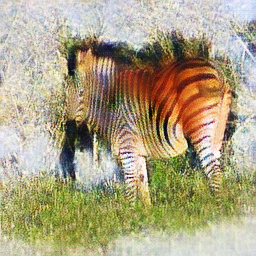
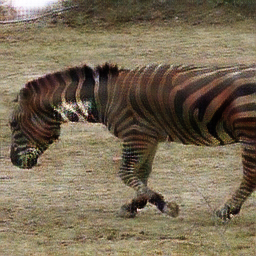

In [15]:
html_tag = generate_images(["generated_horses_zebras/horse_100.png", "generated_horses_zebras/horse_125.png"])
HTML(html_tag)

The above images are generated horses. You can see that the generator tried to make the zebras look like horses by turning it brown, but didn't fully finish. In the paper they train for 200 epochs, perhaps if I trained for longer I would've gotten better results.



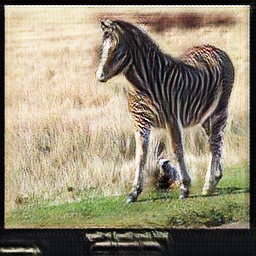
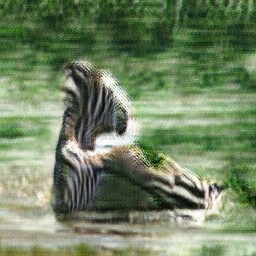
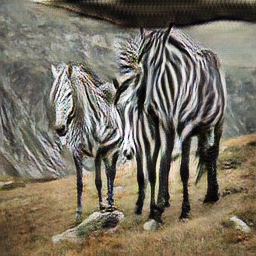

In [16]:
html_tag = generate_images(["generated_horses_zebras/zebra_75.png", "generated_horses_zebras/zebra_100.png", "generated_horses_zebras/zebra_125.png"])
HTML(html_tag)

The above images are generated zebras from horses. We can see that the generator for zebras works significantly better than the generator for horses. Most of the horse is now covered in stripes, and the images are a little bit cleaner than the above images. It's still not perfect, but I think that more epochs would've made the results much better.

Running the horses to zebra dataset proves that the model works according to the resources I used. We can now move on to trying to turn photos into monet style photos.

<h1>Monet to Photo and Vice Versa</h1>

To change the code to work with the monet to photo dataset, all we have to do is change the name of a few variables and we can train on monet photos. For our purposes "horses" in the code will be monet and "zebras" will be photos. There's no reason to go back and rename every variable.

In [126]:
TRAIN_DIR = "./data/monet"

# This dataset is significantly larger so the number of epochs will be smaller for times sake
NUM_EPOCHS = 20

In [127]:
#horses are monet and zebras are photos

def train_fn(disc_H, disc_Z, gen_Z, gen_H, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler):
    loop = tqdm(loader, leave=True)

    for idx, (zebra, horse) in enumerate(loop):
        zebra = zebra.to(DEVICE)
        horse = horse.to(DEVICE)

        with torch.cuda.amp.autocast():
            fake_horse = gen_H(zebra)
            D_H_real = disc_H(horse)
            D_H_fake = disc_H(fake_horse.detach())
            D_H_real_loss = mse(D_H_real, torch.ones_like(D_H_real))
            D_H_fake_loss = mse(D_H_fake, torch.zeros_like(D_H_fake))
            D_H_loss = D_H_real_loss + D_H_fake_loss

            fake_zebra = gen_Z(horse)
            D_Z_real = disc_Z(zebra)
            D_Z_fake = disc_Z(fake_zebra.detach())
            D_Z_real_loss = mse(D_Z_real, torch.ones_like(D_Z_real))
            D_Z_fake_loss = mse(D_Z_fake, torch.zeros_like(D_Z_fake))
            D_Z_loss = D_Z_real_loss + D_Z_fake_loss

            D_loss = (D_H_loss + D_Z_loss)/2

        opt_disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            #adversarial loss for both generators
            D_H_fake = disc_H(fake_horse)
            D_Z_fake = disc_Z(fake_zebra)
            loss_G_H = mse(D_H_fake, torch.ones_like(D_H_fake))
            loss_G_Z = mse(D_Z_fake, torch.ones_like(D_Z_fake))

            #cycle loss
            cycle_zebra = gen_Z(fake_horse)
            cycle_horse = gen_H(fake_zebra)
            cycle_zebra_loss = l1(zebra, cycle_zebra)
            cycle_horse_loss = l1(horse, cycle_horse)

            #identity loss
            identity_zebra = gen_Z(zebra)
            identity_horse = gen_H(horse)
            identity_zebra_loss = l1(zebra, identity_zebra)
            identity_horse_loss = l1(horse, identity_horse)

            #add together
            G_loss = (
                loss_G_Z
                + loss_G_H
                + cycle_zebra_loss * LAMBDA_CYCLE
                + cycle_horse_loss * LAMBDA_CYCLE
                + identity_horse_loss * LAMBDA_IDENTITY
                + identity_zebra_loss * LAMBDA_IDENTITY
            )

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()


        # changed idx to be larger as more photos are generated and change file output name
        if idx % 500 == 0:
            save_image(fake_horse*0.5+0.5, f"saved_images/monet_{idx}.png")
            save_image(fake_zebra*0.5+0.5, f"saved_images/photo_{idx}.png")


In [19]:
def main():
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN_H,
            gen_H,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_GEN_Z,
            gen_Z,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_H,
            disc_H,
            opt_disc,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_Z,
            disc_Z,
            opt_disc,
            LEARNING_RATE,
        )

    # changed filepath
    dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/monet_jpg",
        root_zebra=TRAIN_DIR + "/photo_jpg",
        transform=image_transforms,
    )
    loader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc_H,
            disc_Z,
            gen_Z,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )

        if SAVE_MODEL:
            save_checkpoint(gen_H, opt_gen, filename=CHECKPOINT_GEN_H)
            save_checkpoint(gen_Z, opt_gen, filename=CHECKPOINT_GEN_Z)
            save_checkpoint(disc_H, opt_disc, filename=CHECKPOINT_CRITIC_H)
            save_checkpoint(disc_Z, opt_disc, filename=CHECKPOINT_CRITIC_Z)

In [24]:
# DO NOT RUN. WILL TAKE A LONG TIME
main()

100%|██████████| 7038/7038 [19:40<00:00,  5.96it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:50<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:42<00:00,  5.95it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:34<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:26<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:31<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:31<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:33<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:38<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:32<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:32<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:34<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:34<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:33<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:38<00:00,  5.97it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:35<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:02<00:00,  5.85it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:52<00:00,  5.90it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:34<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


Training on the monet to photo dataset took 392 minutes and 39 seconds on a RTX 3070. This is approximately 6 and a half hours. This run through I trained for 20 epochs with the dataset being 7,038 photos large. Let's look at the results.


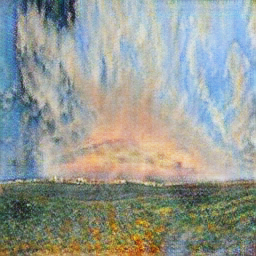
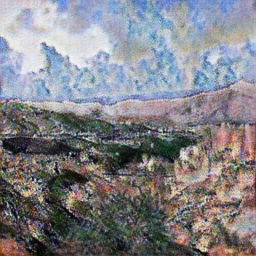
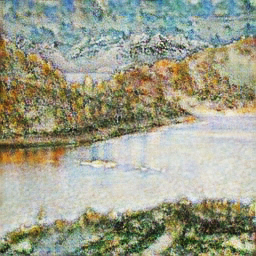
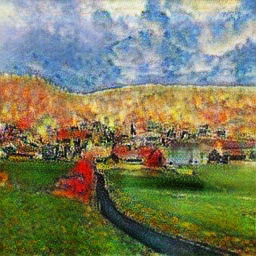
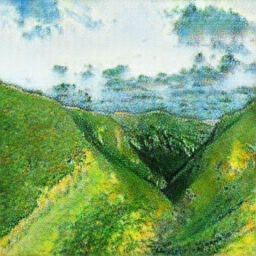

In [20]:
html_tag = generate_images(["monet_20_epochs/monet_1600.png",
                            "monet_20_epochs/monet_1700.png", 
                            "monet_20_epochs/monet_1800.png", 
                            "monet_20_epochs/monet_2600.png", 
                            "monet_20_epochs/monet_5900.png"])
HTML(html_tag)

The generated monet photos look quite good for 20 epochs. They are a little bit grainy, but look like a decent replication when compared to some originals. However, these are all good examples I picked out. The following are some side by sides of pictures and then their transformation to monet style photos.

In [128]:
# change the path to the saved 20 epoch version
CHECKPOINT_GEN_H = "./monet_20_epochs_model/genh_monet_20epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_20_epochs_model/genz_monet_20epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_20_epochs_model/critich_monet_20epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_20_epochs_model/criticz_monet_20epochs.pth.tar"

This function will help us visualize the original photo and the generated fake

In [24]:
# original
def plot_before_and_after(original, generated):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))

    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax1.set_title("Original")
    ax2.set_title("Generated")
    
    ax1.imshow(original)
    ax2.imshow(generated)

    # Show the figure
    plt.show()


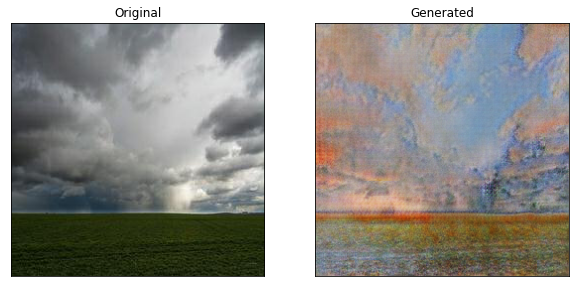

In [98]:
original, output = test_output("./data/monet/photo_jpg/00104fd531.jpg", False)
plot_before_and_after(original, output)

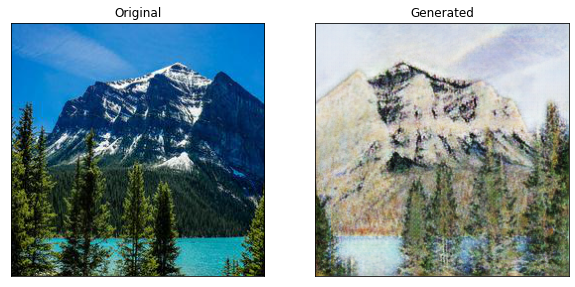

In [99]:
original, output = test_output("./data/monet/photo_jpg/48c641285b.jpg", False)
plot_before_and_after(original, output)

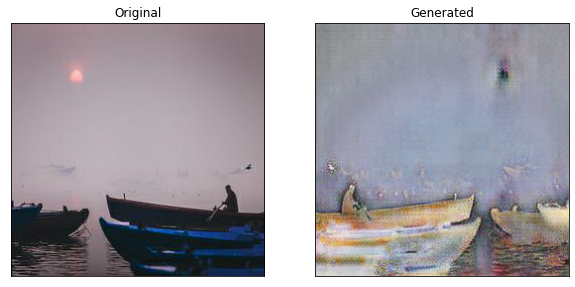

In [100]:
original, output = test_output("./data/monet/photo_jpg/00479e2a21.jpg", False)
plot_before_and_after(original, output)

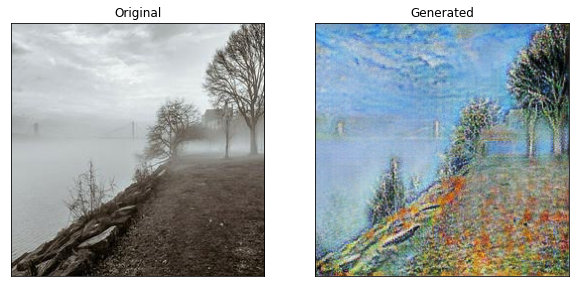

In [101]:
original, output = test_output("./data/monet/photo_jpg/02c6c1f6a9.jpg", False)
plot_before_and_after(original, output)

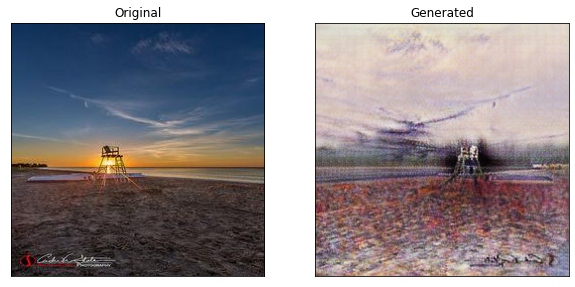

In [102]:
original, output = test_output("./data/monet/photo_jpg/1240cc6f83.jpg", False)
plot_before_and_after(original, output)

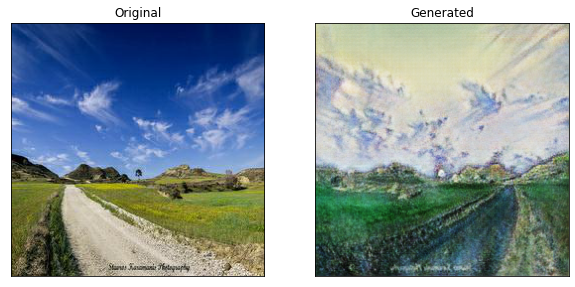

In [103]:
original, output = test_output("./data/monet/photo_jpg/115cd80f74.jpg", False)
plot_before_and_after(original, output)

From what we can see, the model performs much better on landscape and nature photos than others. It also flips the photos a lot of the time and sometimes doesn't, which is odd. Overall, the photos look pretty good for 20 epochs. Let's see if the model performs the same the other way around.

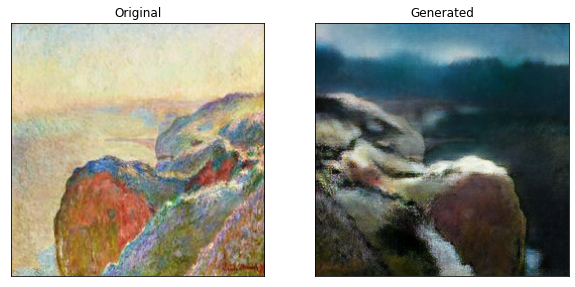

In [104]:
original, output = test_output("./data/monet/monet_jpg/000c1e3bff.jpg", True)
plot_before_and_after(original, output)

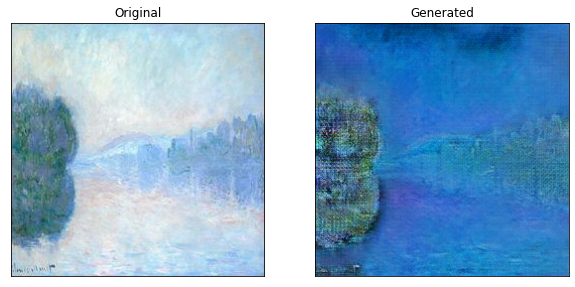

In [105]:
original, output = test_output("./data/monet/monet_jpg/0260d15306.jpg", True)
plot_before_and_after(original, output)

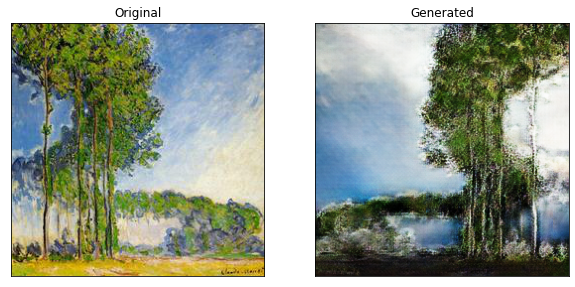

In [106]:
original, output = test_output("./data/monet/monet_jpg/052a77c020.jpg", True)
plot_before_and_after(original, output)

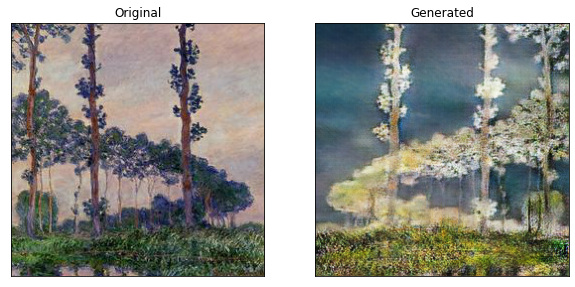

In [107]:
original, output = test_output("./data/monet/monet_jpg/fd63a333f1.jpg", True)
plot_before_and_after(original, output)

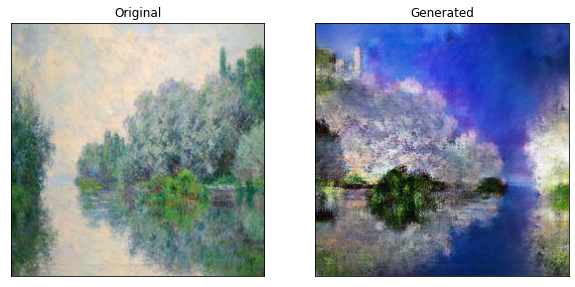

In [108]:
original, output = test_output("./data/monet/monet_jpg/fb3b06dcb2.jpg", True)
plot_before_and_after(original, output)

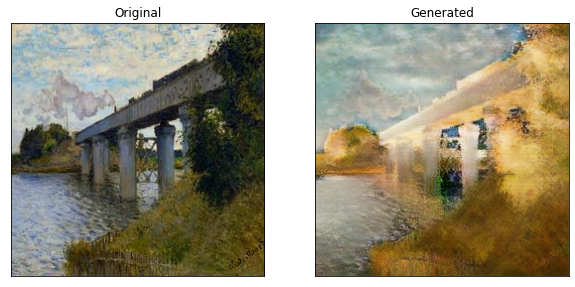

In [109]:
original, output = test_output("./data/monet/monet_jpg/1a127acf4d.jpg", True)
plot_before_and_after(original, output)

Overall, not so great. A few of the generated monets could pass as believeable to someone who doesn't know art, however all of the photos generated from monets do not look believeable in the slightest.

Let's see what happens when we train for 50 epochs.

In [18]:
TRAIN_DIR = "./data/monet"

# This dataset is significantly larger so the number of epochs will be smaller for times sake
NUM_EPOCHS = 50
SAVE_MODEL = True

In [25]:
# DO NOT RUN. WILL TAKE A LONG TIME
main()

100%|██████████| 7038/7038 [20:51<00:00,  5.62it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:31<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:32<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:29<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:21<00:00,  6.06it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:24<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:25<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:26<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:30<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:28<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:30<00:00,  6.01it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:29<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:24<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:26<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:25<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:24<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:33<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:25<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:25<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:25<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:23<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:24<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:23<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:23<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:23<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:21<00:00,  6.06it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:27<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:29<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:29<00:00,  6.02it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:44<00:00,  5.94it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:08<00:00,  5.55it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:22<00:00,  5.49it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:35<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:05<00:00,  5.84it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:27<00:00,  5.73it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:55<00:00,  5.89it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:23<00:00,  6.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:26<00:00,  6.04it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:02<00:00,  5.85it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:33<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:51<00:00,  5.91it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:35<00:00,  5.99it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:07<00:00,  5.83it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:36<00:00,  5.98it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:26<00:00,  6.03it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [19:32<00:00,  6.00it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


Training for 50 epochs took approximately 1000 minutes which is 16.67 hours on a RTX 3070.

In [125]:
# change the path to the saved 50 epoch version
CHECKPOINT_GEN_H = "./monet_50_epochs_model/genh_monet_50epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_50_epochs_model/genz_monet_50epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_50_epochs_model/critich_monet_50epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_50_epochs_model/criticz_monet_50epochs.pth.tar"

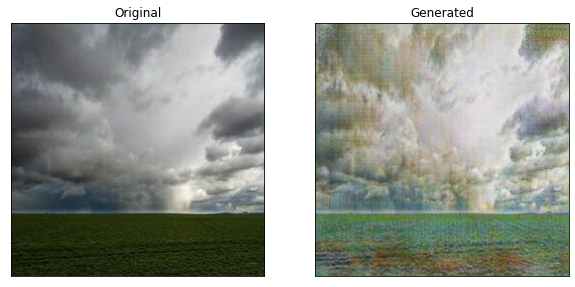

In [112]:
original, output = test_output("./data/monet/photo_jpg/00104fd531.jpg", False)
plot_before_and_after(original, output)

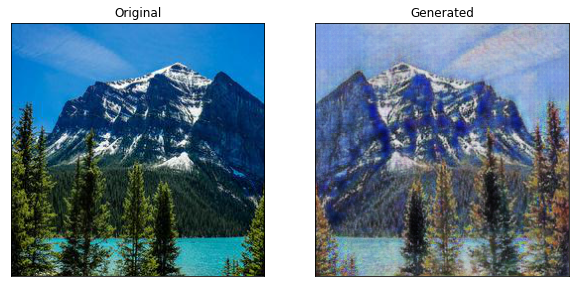

In [113]:
original, output = test_output("./data/monet/photo_jpg/48c641285b.jpg", False)
plot_before_and_after(original, output)

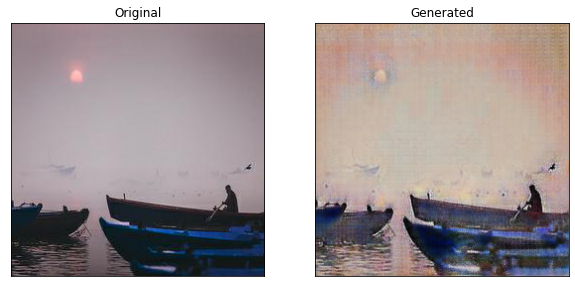

In [114]:
original, output = test_output("./data/monet/photo_jpg/00479e2a21.jpg", False)
plot_before_and_after(original, output)

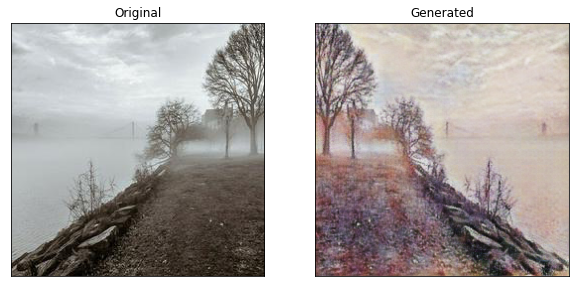

In [115]:
original, output = test_output("./data/monet/photo_jpg/02c6c1f6a9.jpg", False)
plot_before_and_after(original, output)

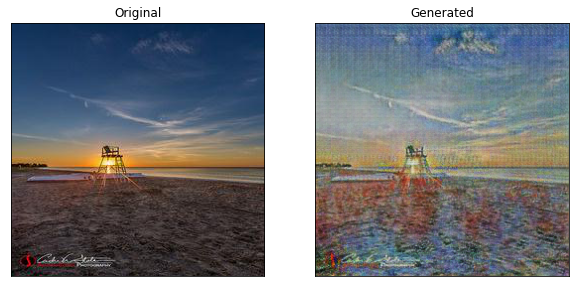

In [116]:
original, output = test_output("./data/monet/photo_jpg/1240cc6f83.jpg", False)
plot_before_and_after(original, output)

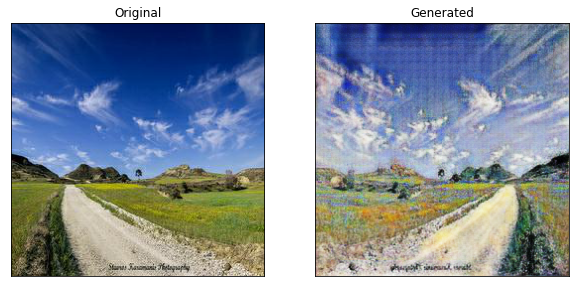

In [117]:
original, output = test_output("./data/monet/photo_jpg/115cd80f74.jpg", False)
plot_before_and_after(original, output)

The generated monets do look somewhat better. They are a little bit less grainy and more clear than the 20 epoch monets. Let's look at how the generator for monet to photo does after 50 epochs.

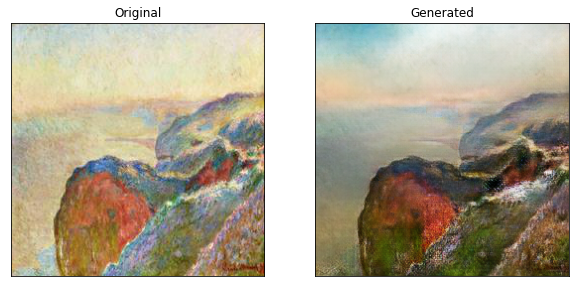

In [119]:
original, output = test_output("./data/monet/monet_jpg/000c1e3bff.jpg", True)
plot_before_and_after(original, output)

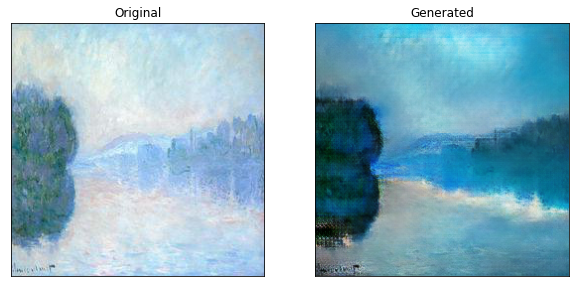

In [120]:
original, output = test_output("./data/monet/monet_jpg/0260d15306.jpg", True)
plot_before_and_after(original, output)

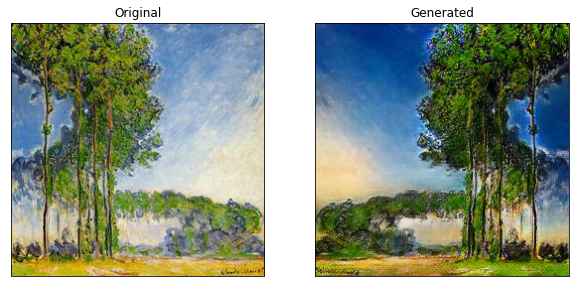

In [121]:
original, output = test_output("./data/monet/monet_jpg/052a77c020.jpg", True)
plot_before_and_after(original, output)

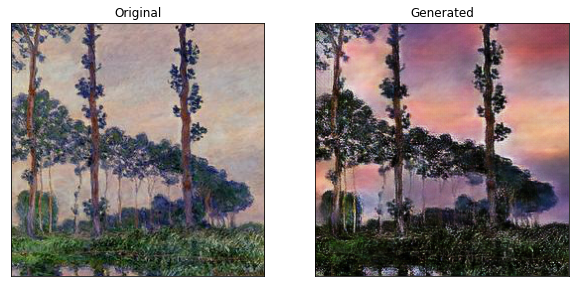

In [122]:
original, output = test_output("./data/monet/monet_jpg/fd63a333f1.jpg", True)
plot_before_and_after(original, output)

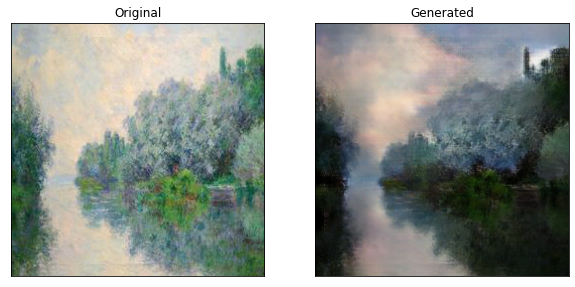

In [123]:
original, output = test_output("./data/monet/monet_jpg/fb3b06dcb2.jpg", True)
plot_before_and_after(original, output)

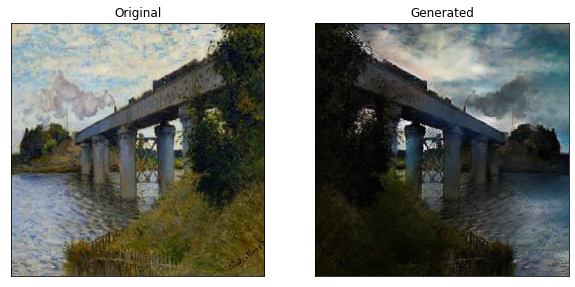

In [124]:
original, output = test_output("./data/monet/monet_jpg/1a127acf4d.jpg", True)
plot_before_and_after(original, output)

The last photo looks awesome, it could almost pass for a real photo. The rest, not so much. They all still look a lot like art and are grainy as well. Let's train again for another 50 epochs. I figured out that I could load my model and resume training after the first 50 epochs I trained. I wish I knew that earlier.

In [129]:
NUM_EPOCHS = 50
LOAD_MODEL = True
SAVE_MODEL = True

First we need to make a minor change to the save model paths so we don't overwrite our 50 epoch model

In [130]:
def main():
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN_H,
            gen_H,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_GEN_Z,
            gen_Z,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_H,
            disc_H,
            opt_disc,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_Z,
            disc_Z,
            opt_disc,
            LEARNING_RATE,
        )

    # changed filepath
    dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/monet_jpg",
        root_zebra=TRAIN_DIR + "/photo_jpg",
        transform=image_transforms,
    )
    loader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc_H,
            disc_Z,
            gen_Z,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )

    # changed the filename so we don't override our 50 epoch model
        if SAVE_MODEL:
            save_checkpoint(gen_H, opt_gen, filename="genh_monet_100epochs.pth.tar")
            save_checkpoint(gen_Z, opt_gen, filename="genz_monet_100epochs.pth.tar")
            save_checkpoint(disc_H, opt_disc, filename="critich_monet_100epochs.pth.tar")
            save_checkpoint(disc_Z, opt_disc, filename="criticz_monet_100epochs.pth.tar")

In [131]:
# DO NOT RUN. WILL TAKE A LONG TIME
main()

100%|██████████| 7038/7038 [31:12<00:00,  3.76it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:52<00:00,  5.62it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:32<00:00,  5.71it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:38<00:00,  5.42it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:36<00:00,  5.69it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:23<00:00,  5.48it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:53<00:00,  5.36it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:34<00:00,  5.70it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:42<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [24:11<00:00,  4.85it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [36:14<00:00,  3.24it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [25:51<00:00,  4.54it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:41<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:39<00:00,  5.68it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:40<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:42<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:39<00:00,  5.68it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:42<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:55<00:00,  5.61it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:40<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:40<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:41<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:45<00:00,  5.65it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:40<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:42<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:41<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:39<00:00,  5.68it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:42<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:38<00:00,  5.68it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:41<00:00,  5.67it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:45<00:00,  5.65it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:47<00:00,  5.64it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:48<00:00,  5.64it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:45<00:00,  5.65it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:58<00:00,  5.59it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [21:18<00:00,  5.50it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:43<00:00,  5.66it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:48<00:00,  5.64it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:46<00:00,  5.65it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:55<00:00,  5.61it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:39<00:00,  5.68it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:48<00:00,  5.64it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [20:33<00:00,  5.71it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [22:32<00:00,  5.20it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 7038/7038 [23:14<00:00,  5.05it/s]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


50 more epochs took 1078 minutes and 57 seconds. About 18 hours.

In [25]:
# switch to 100 epoch model
CHECKPOINT_GEN_H = "./monet_100_epochs_model/genh_monet_100epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_100_epochs_model/genz_monet_100epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_100_epochs_model/critich_monet_100epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_100_epochs_model/criticz_monet_100epochs.pth.tar"

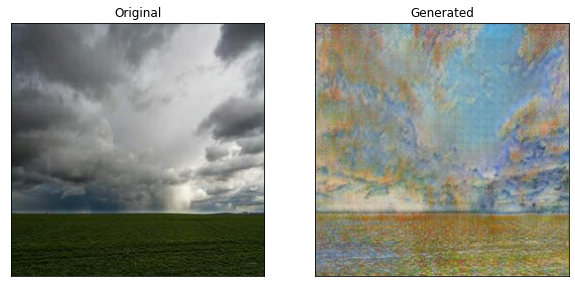

In [133]:
original, output = test_output("./data/monet/photo_jpg/00104fd531.jpg", False)
plot_before_and_after(original, output)

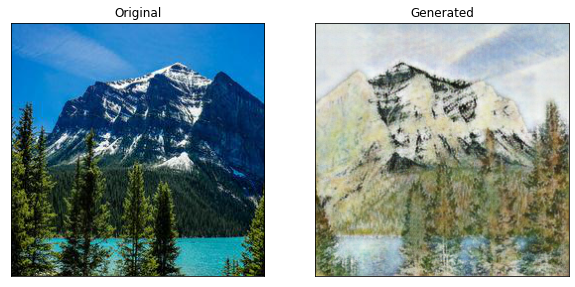

In [134]:
original, output = test_output("./data/monet/photo_jpg/48c641285b.jpg", False)
plot_before_and_after(original, output)

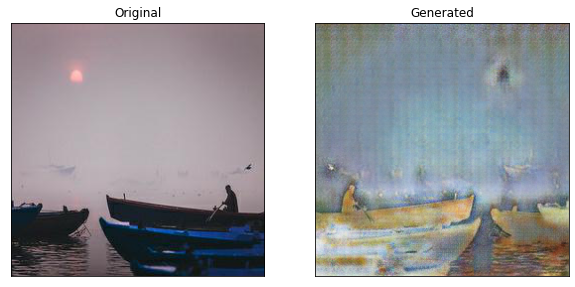

In [135]:
original, output = test_output("./data/monet/photo_jpg/00479e2a21.jpg", False)
plot_before_and_after(original, output)

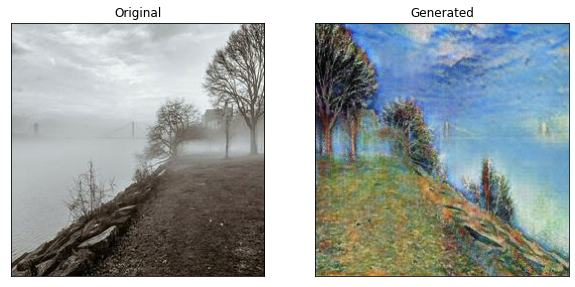

In [136]:
original, output = test_output("./data/monet/photo_jpg/02c6c1f6a9.jpg", False)
plot_before_and_after(original, output)

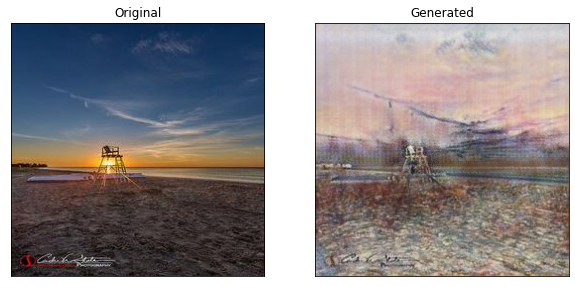

In [137]:
original, output = test_output("./data/monet/photo_jpg/1240cc6f83.jpg", False)
plot_before_and_after(original, output)

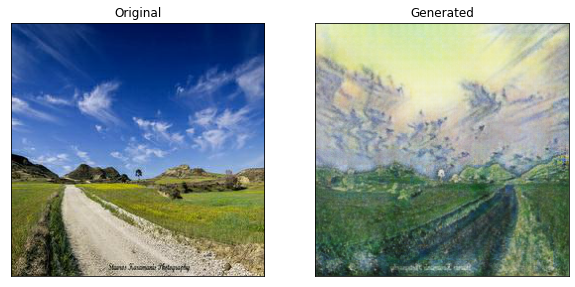

In [138]:
original, output = test_output("./data/monet/photo_jpg/115cd80f74.jpg", False)
plot_before_and_after(original, output)

The generated paintings look quite similar to the 20 epoch version. Maybe the photos will look better.

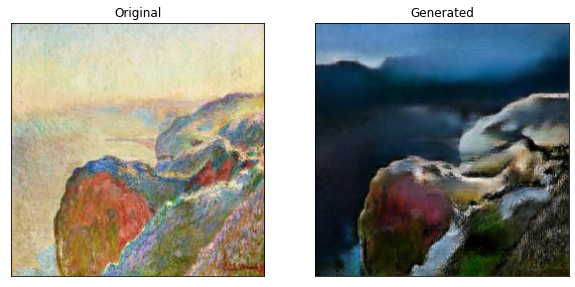

In [139]:
original, output = test_output("./data/monet/monet_jpg/000c1e3bff.jpg", True)
plot_before_and_after(original, output)

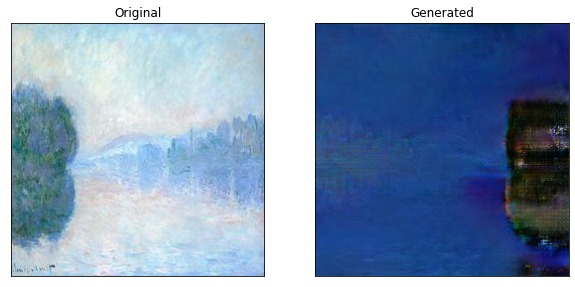

In [140]:
original, output = test_output("./data/monet/monet_jpg/0260d15306.jpg", True)
plot_before_and_after(original, output)

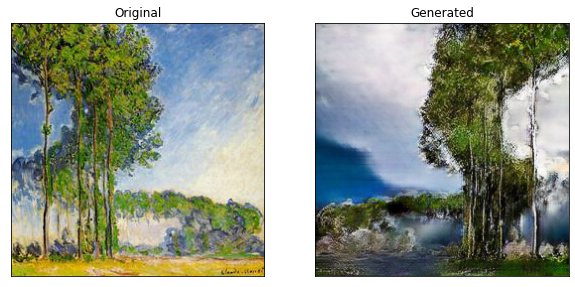

In [141]:
original, output = test_output("./data/monet/monet_jpg/052a77c020.jpg", True)
plot_before_and_after(original, output)

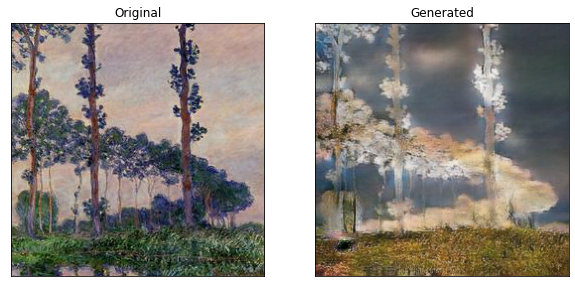

In [142]:
original, output = test_output("./data/monet/monet_jpg/fd63a333f1.jpg", True)
plot_before_and_after(original, output)

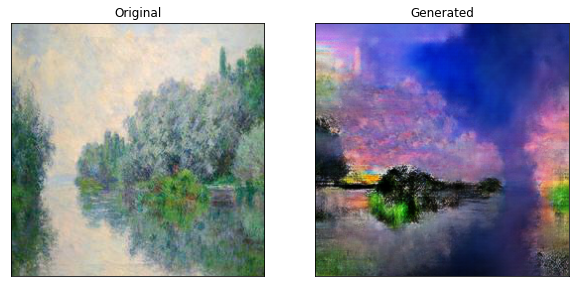

In [143]:
original, output = test_output("./data/monet/monet_jpg/fb3b06dcb2.jpg", True)
plot_before_and_after(original, output)

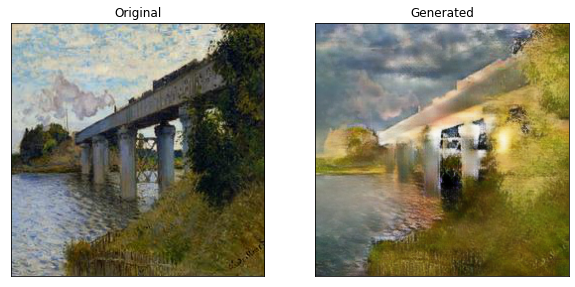

In [144]:
original, output = test_output("./data/monet/monet_jpg/1a127acf4d.jpg", True)
plot_before_and_after(original, output)

The generated photos look pretty terrible. They look a lot like the 20 epoch photos. The bridge with the train looked quite believable before, but now it definitely does not look like a photo. The rest of the photos as well aren't even close to real photos. Let's compare side by side for each epoch.

In [162]:
# original
# we need to make a minor adjustment to testoutput to let us change the models inside of a function
def test_output(img_filepath, is_horse, epoch):
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )
    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    #added checkpoint functionality
    CHECKPOINT_GEN_H = f"./monet_{epoch}_epochs_model/genh_monet_{epoch}epochs.pth.tar"
    CHECKPOINT_GEN_Z = f"./monet_{epoch}_epochs_model/genz_monet_{epoch}epochs.pth.tar"
    CHECKPOINT_CRITIC_H = f"./monet_{epoch}_epochs_model/critich_monet_{epoch}epochs.pth.tar"
    CHECKPOINT_CRITIC_Z = f"./monet_{epoch}_epochs_model/criticz_monet_{epoch}epochs.pth.tar"

    load_checkpoint(
        CHECKPOINT_GEN_H,
        gen_H,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_GEN_Z,
        gen_Z,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_H,
        disc_H,
        opt_disc,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_Z,
        disc_Z,
        opt_disc,
        LEARNING_RATE,
    )
    

    x = np.array(Image.open(img_filepath).convert("RGB"))
    original = Image.fromarray(x)
    augmentations = image_transforms(image=x)
    x = augmentations["image"].to(DEVICE)

    transform = transformer.ToPILImage()
    
    if is_horse:
        return original,transform((gen_Z.forward(x)*0.5+0.5).detach())
    else:
        return original,transform((gen_H.forward(x)*0.5+0.5).detach())

In [163]:
# original
def generate_image_table():
        # Create a figure with two subplots
    fig, axs = plt.subplots(ncols=4, nrows=12, figsize=(20, 40))

    # Set Axis ticks and titles
    for i in range(12):
        for j in range(4):
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])
            
    axs[0,0].set_title("Original")
    axs[0,1].set_title("20 Epochs")
    axs[0,2].set_title("50 Epochs")
    axs[0,3].set_title("100 Epochs")

    # for each model generate photos

    photos =       ["./data/monet/photo_jpg/00104fd531.jpg", 
                    "./data/monet/photo_jpg/48c641285b.jpg",
                    "./data/monet/photo_jpg/00479e2a21.jpg",
                    "./data/monet/photo_jpg/02c6c1f6a9.jpg",
                    "./data/monet/photo_jpg/1240cc6f83.jpg",
                    "./data/monet/photo_jpg/115cd80f74.jpg"]
    
    monet_photos =  ["./data/monet/monet_jpg/000c1e3bff.jpg",
                     "./data/monet/monet_jpg/0260d15306.jpg",
                     "./data/monet/monet_jpg/052a77c020.jpg",
                     "./data/monet/monet_jpg/fd63a333f1.jpg",
                     "./data/monet/monet_jpg/fb3b06dcb2.jpg",
                     "./data/monet/monet_jpg/1a127acf4d.jpg"]
    
    epochs =        [20,
                     50,
                     100]
    
    for i in range(3):
        epoch = epochs[i]
        
        for j in range(len(photos)):
            original, output = test_output(photos[j], False, epoch)

            if i == 0:
                axs[j,i].imshow(original)
                axs[j,i + 1].imshow(output)

            if i == 1:
                axs[j,i + 1].imshow(output)

            if i == 2:
                axs[j,i + 1].imshow(output)

        for j in range(len(monet_photos)):
            original, output = test_output(monet_photos[j], True, epoch)

            if i == 0:
                axs[j + 6,i].imshow(original)
                axs[j + 6,i + 1].imshow(output)

            if i == 1:
                axs[j + 6,i + 1].imshow(output)

            if i == 2:
                axs[j + 6,i + 1].imshow(output)


    # Show the figure
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()

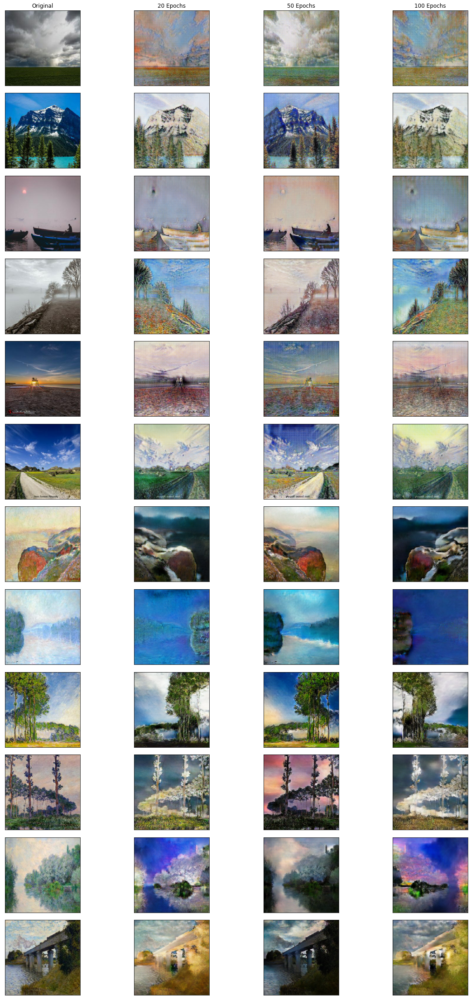

In [164]:
generate_image_table()

To me, the 20 and 100 epoch verison look quite similar. Perhaps the model got caught in a local minima on the gradient and couldn't continue training. Let's look at the errors and see what happened.

We have to change a few things in train and test to extract the error values

In [48]:
def train_fn(disc_H, disc_Z, gen_Z, gen_H, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler):
    loop = tqdm(loader, leave=True)

    total_D_Loss = 0
    total_G_Loss = 0

    for idx, (zebra, horse) in enumerate(loop):
        zebra = zebra.to(DEVICE)
        horse = horse.to(DEVICE)

        with torch.cuda.amp.autocast():
            fake_horse = gen_H(zebra)
            D_H_real = disc_H(horse)
            D_H_fake = disc_H(fake_horse.detach())
            D_H_real_loss = mse(D_H_real, torch.ones_like(D_H_real))
            D_H_fake_loss = mse(D_H_fake, torch.zeros_like(D_H_fake))
            D_H_loss = D_H_real_loss + D_H_fake_loss

            fake_zebra = gen_Z(horse)
            D_Z_real = disc_Z(zebra)
            D_Z_fake = disc_Z(fake_zebra.detach())
            D_Z_real_loss = mse(D_Z_real, torch.ones_like(D_Z_real))
            D_Z_fake_loss = mse(D_Z_fake, torch.zeros_like(D_Z_fake))
            D_Z_loss = D_Z_real_loss + D_Z_fake_loss

            D_loss = (D_H_loss + D_Z_loss)/2

            total_D_Loss += D_loss

            opt_disc.zero_grad()
            d_scaler.scale(D_loss).backward()
            d_scaler.step(opt_disc)
            d_scaler.update()


        with torch.cuda.amp.autocast():
            #adversarial loss for both generators
            D_H_fake = disc_H(fake_horse)
            D_Z_fake = disc_Z(fake_zebra)
            loss_G_H = mse(D_H_fake, torch.ones_like(D_H_fake))
            loss_G_Z = mse(D_Z_fake, torch.ones_like(D_Z_fake))

            #cycle loss
            cycle_zebra = gen_Z(fake_horse)
            cycle_horse = gen_H(fake_zebra)
            cycle_zebra_loss = l1(zebra, cycle_zebra)
            cycle_horse_loss = l1(horse, cycle_horse)

            #identity loss
            identity_zebra = gen_Z(zebra)
            identity_horse = gen_H(horse)
            identity_zebra_loss = l1(zebra, identity_zebra)
            identity_horse_loss = l1(horse, identity_horse)

            #add together
            G_loss = (
                loss_G_Z
                + loss_G_H
                + cycle_zebra_loss * LAMBDA_CYCLE
                + cycle_horse_loss * LAMBDA_CYCLE
                + identity_horse_loss * LAMBDA_IDENTITY
                + identity_zebra_loss * LAMBDA_IDENTITY
            )

            total_G_Loss += G_loss

            opt_gen.zero_grad()
            g_scaler.scale(G_loss).backward()
            g_scaler.step(opt_gen)
            g_scaler.update()

        # break after 20 iterations
        if idx == 20:
            break
    
    # now returns the total losses for discriminator and generator over 7038 iterations

    return total_G_Loss, total_D_Loss


In [49]:
# original
def test():    
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_Z = Discriminator(in_channels=3).to(DEVICE)
    gen_Z = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_Z.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_Z.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()
    
    load_checkpoint(
        CHECKPOINT_GEN_H,
        gen_H,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_GEN_Z,
        gen_Z,
        opt_gen,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_H,
        disc_H,
        opt_disc,
        LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC_Z,
        disc_Z,
        opt_disc,
        LEARNING_RATE,
    )
    test_dataset = HorseZebraDataset(
        root_horse=TRAIN_DIR + "/monet_jpg",
        root_zebra=TRAIN_DIR + "/photo_jpg",
        transform=image_transforms,
    )
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        pin_memory=True,
    )
    loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )

    # now gets gloss and dloss from train

    G_loss = 0
    D_loss = 0

    for epoch in range(1):
        gloss, dloss = train_fn(
            disc_H,
            disc_Z,
            gen_Z,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )
        G_loss = gloss
        D_loss = dloss
    
    return G_loss, D_loss

Here we run through each of the saved models and get their total loss over 20 iterations.

In [80]:
SAVE_MODEL = False
LOAD_MODEL = True

After running all the experiments my CUDA memory was full, this function helps to flush out any unused memory

In [51]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [81]:
CHECKPOINT_GEN_H = "./monet_20_epochs_model/genh_monet_20epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_20_epochs_model/genz_monet_20epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_20_epochs_model/critich_monet_20epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_20_epochs_model/criticz_monet_20epochs.pth.tar"

G_loss_20_epochs, D_loss_20_epochs = test()

  0%|          | 20/7038 [00:19<1:56:07,  1.01it/s]


In [82]:
CHECKPOINT_GEN_H = "./monet_50_epochs_model/genh_monet_50epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_50_epochs_model/genz_monet_50epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_50_epochs_model/critich_monet_50epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_50_epochs_model/criticz_monet_50epochs.pth.tar"

G_loss_50_epochs, D_loss_50_epochs = test()

  0%|          | 20/7038 [00:20<1:58:21,  1.01s/it]


In [83]:
CHECKPOINT_GEN_H = "./monet_100_epochs_model/genh_monet_100epochs.pth.tar"
CHECKPOINT_GEN_Z = "./monet_100_epochs_model/genz_monet_100epochs.pth.tar"
CHECKPOINT_CRITIC_H = "./monet_100_epochs_model/critich_monet_100epochs.pth.tar"
CHECKPOINT_CRITIC_Z = "./monet_100_epochs_model/criticz_monet_100epochs.pth.tar"

G_loss_100_epochs, D_loss_100_epochs = test()

  0%|          | 20/7038 [00:20<1:57:37,  1.01s/it]


In [84]:
G_loss_20_epochs = G_loss_20_epochs.detach().cpu().item()/20
D_loss_20_epochs = D_loss_20_epochs.detach().cpu().item()/20

G_loss_50_epochs = G_loss_50_epochs.detach().cpu().item()/20
D_loss_50_epochs = D_loss_50_epochs.detach().cpu().item()/20

G_loss_100_epochs = G_loss_100_epochs.detach().cpu().item()/20
D_loss_100_epochs = D_loss_100_epochs.detach().cpu().item()/20

In [85]:
import pandas as pd

G_loss = [G_loss_20_epochs, G_loss_50_epochs, G_loss_100_epochs]
D_loss = [D_loss_20_epochs, D_loss_50_epochs, D_loss_100_epochs]

df = pd.DataFrame(columns=["20_epochs", "50_epochs", "100_epochs"])
df.loc[0] = G_loss
df.loc[1] = D_loss

df

,20_epochs,50_epochs,100_epochs
0,2.689438,2.394137,2.691266
1,0.392421,0.324392,0.303599


<h4>Loss Explanation</h4>

Both the 20 and 100 epoch versions of the model have similar Generator Loss averages over 20 iterations, while the 50 epoch version was about .3 less. The Discriminator Loss values however steadily decrease as the epochs increase. To understand why that is we need to understand how the loss is calculated.

The discriminator wants to determine whether or not an image is real or fake. The discriminator loss is calculated by measuring the difference between the predicted probability of an image being real or fake and the actual label. This means that by minimizing the discriminator loss we can make the discriminator very good at distinguishing between real and fake. So when looking at the D loss values we can see that the value is decreasing, slowly but surely which means our discriminators are getting better at telling the difference between real and generated images. What does this mean for our generator?

The generator's job is to generate images good enough to fool the discriminator. So as the discriminator's error gets lower, the generator's job gets harder and it has to learn how to make more realistic images. The generators loss is the measure of how well it is able to fool the discriminator, with the addition of cycle loss (generating X again from a fake Y) and identity loss (generating X from a real X). Overall, we get a number that measures how well the generator is able to generate images that are as close as possible to the target while also being consistent with the original.

The reason we get a higher generator loss for both 20 epochs and 100 epochs is likely because as the discriminator gets better at telling the difference between real and fake, the generator has to catch up. This would explain why the generator loss went back up at 100 epochs, the discriminator loss got lower and as a result the generator is having a harder time fooling the discriminator which makes the error go back up. This might also explain why the photos from 20 epochs and 100 epochs look similar. The generator wants to fool the discriminator and after 20 epochs the generator error went down. The generator might "think" to try the same approach it used last time at 20 epochs to make the error go down again at 100 epochs.

<h4>Conclusion</h4>

More training would likely fix this, however I am running short on time as training this model takes a significant amount of computing power and time. The results I achieved are satisfactory as it proves the model functions as intended and more training would likely get results similar to the paper. If I had more time I would have liked to finish training all 200 epochs and create more functions to help visualize learning, however creating those functions and rerunning the experiments would take far too much time. Overall I learned a lot about cycleGAN and generative AI models in general. I learned how to visualize the outputs of the model and manipulate it to give me individual photos, test on one epoch, and give error outputs. I have also learned quite a bit of pytorch in the process and have a better understanding of how pytorch is used to create machine learning models.